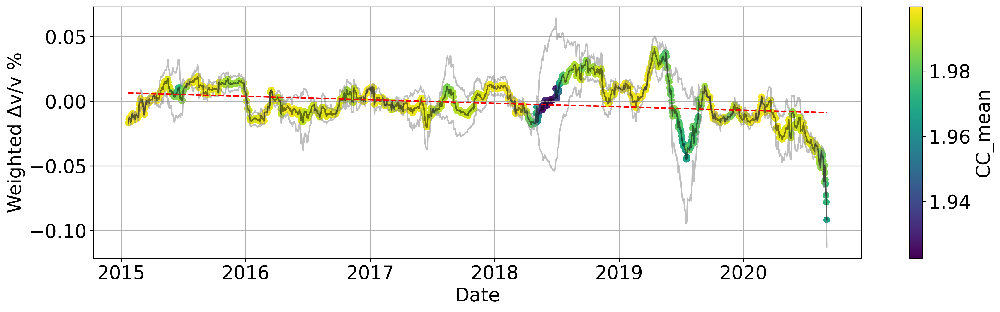

In [53]:
# import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

# Define the paths to your CSV files
file_paths = [
    'HYS12_13ZEp1.csv',
    'HYS12_13ZEn1.csv',
]

# Predefined array with multipliers (-1 or +1)
multipliers = [1, 1]

# Read and process dataframes
dataframes = []
for path, multiplier in zip(file_paths, multipliers):
    df = pd.read_csv(path)
    df['DVT'] *= multiplier  # Apply the multiplier to the DVT column
    df['T'] = pd.to_datetime(df['T'])
    df.set_index('T', inplace=True)
    dataframes.append(df)

# Create a unified time index from the union of all timestamps in the dataframes
unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))

# Interpolate data for each dataframe to match the unified index
interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

# Shift the grey individual timeseries by 20 days and plot them
plt.figure(figsize=(16, 5), dpi=300)
for df in interpolated_dfs:
    shifted_df = df.copy()
    shifted_df.index = shifted_df.index + pd.DateOffset(days=20)
    plt.plot(shifted_df.index, shifted_df['DVT'], color='grey', alpha=0.5)

# Calculate CC_mean using squared correlation coefficients for each time point
CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)

# Calculate weighted Δu/u using squared CCT and DVT
weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

# Normalize CC_mean for coloring
norm = mcolors.Normalize(vmin=CC_mean.min(), vmax=CC_mean.max())
cmap = cm.viridis  # Can choose any available colormap

# Create a DataFrame for the weighted Δv/v time series
weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=20)

# Plotting the weighted Δv/v time series with color-coded CC_mean
# Scatter plot for individual markers with color coding
sc = plt.scatter(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], c=CC_mean, cmap=cmap, norm=norm, label='Weighted Δv/v')
# Line plot to connect markers
plt.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], 'k-', alpha=0.5)  # Adjust alpha for line transparency
plt.colorbar(sc, label='CC_mean')

# Adding a trend line
cleaned_df = weighted_dvv_df.dropna(subset=['Weighted Δv/v'])
index_as_int = cleaned_df.index.astype(np.int64)
z = np.polyfit(index_as_int, cleaned_df['Weighted Δv/v'], 1)
p = np.poly1d(z)
plt.plot(weighted_dvv_df.index, p(weighted_dvv_df.index.astype(np.int64)), "r--", label='Trend Line')

# Add labels and legend
plt.xlabel('Date')
#plt.ylim([-0.25, 0.25])
plt.ylabel('Weighted Δv/v %')
plt.grid(True)
plt.tight_layout()
plt.show()


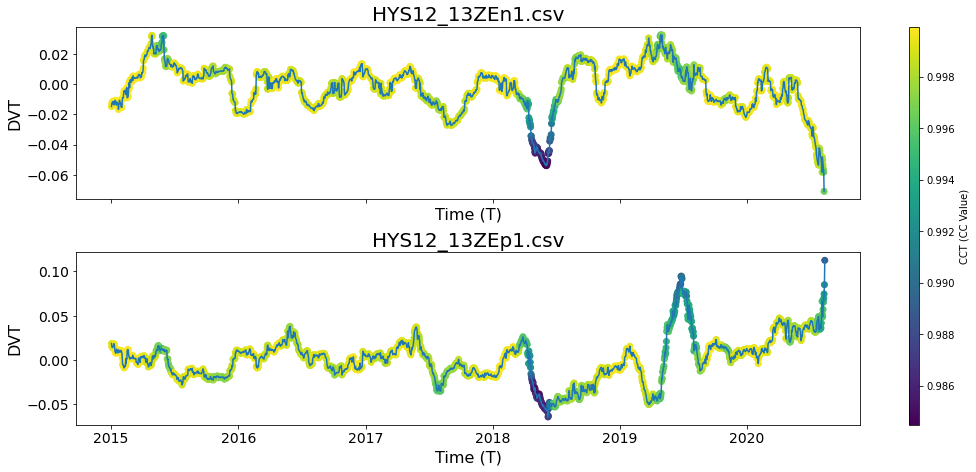

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# List of all file paths
file_paths = ['HYS12_13ZEn1.csv', 'HYS12_13ZEp1.csv']

# Predefined array of inversion switches
inversion_array = [1,-1]

start_date = pd.to_datetime("2015-01-01")
end_date = pd.to_datetime("2021-01-01")

# Create a figure with 6 subplots (3 rows and 2 columns)
fig, axs = plt.subplots(len(file_paths), 1, figsize=(15, len(file_paths)*3.33), sharex=True, sharey=False)

# Flatten the array of axes for easier iteration
axs = axs.flatten()

for idx, file_path in enumerate(file_paths):
    # Load the data
    data = pd.read_csv(file_path)
    
    # Convert the 'T' column to datetime format if necessary
    data['T'] = pd.to_datetime(data['T'])
    
    # Apply inversion based on the predefined array
    data['DVT'] *= inversion_array[idx]
    
    # Plotting scatter and line on the corresponding subplot
    scatter = axs[idx].scatter(data['T'], data['DVT'], c=data['CCT'], cmap='viridis', label='Scatter')
    axs[idx].plot(data['T'], data['DVT'], label='Line')
    
    # Set title and labels for each subplot
    axs[idx].set_title(os.path.basename(file_path), fontsize=20)
    axs[idx].set_xlabel('Time (T)', fontsize=16)
    axs[idx].set_ylabel('DVT', fontsize=16)
    axs[idx].tick_params(axis='both', which='major', labelsize=14)
    #axs[idx].set_xlim([start_date, end_date])  # Set x-axis limits
    #axs[idx].set_ylim([-0.3, 0.3])  # Set x-axis limits

# Adjust subplot layout
plt.tight_layout()
#plt.ylim([-1.0,1.0])

# Add a color bar in the figure
fig.colorbar(scatter, ax=axs, orientation='vertical', label='CCT (CC Value)', aspect=40)

# Show the plot
plt.show()


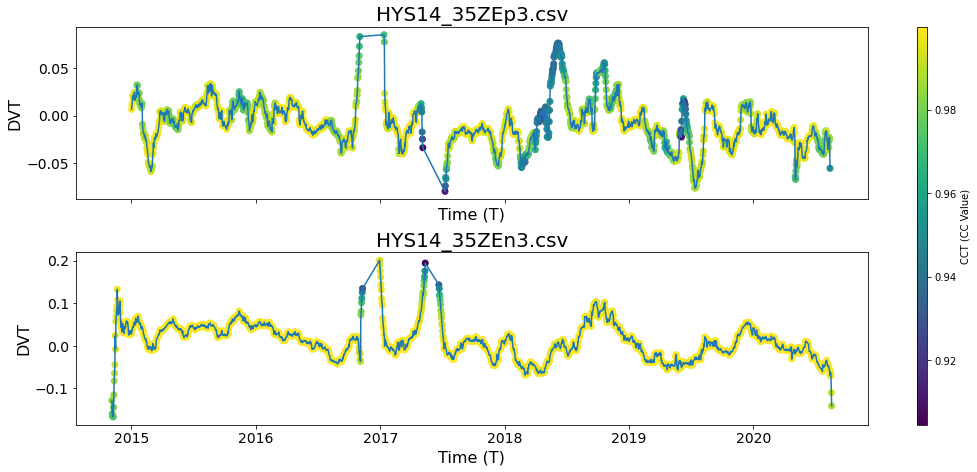

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# List of all file paths
file_paths = ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv']

# Predefined array of inversion switches
inversion_array = [1,-1]

start_date = pd.to_datetime("2015-01-01")
end_date = pd.to_datetime("2021-01-01")

# Create a figure with 6 subplots (3 rows and 2 columns)
fig, axs = plt.subplots(len(file_paths), 1, figsize=(15, len(file_paths)*3.33), sharex=True, sharey=False)

# Flatten the array of axes for easier iteration
axs = axs.flatten()

for idx, file_path in enumerate(file_paths):
    # Load the data
    data = pd.read_csv(file_path)
    
    # Convert the 'T' column to datetime format if necessary
    data['T'] = pd.to_datetime(data['T'])
    
    # Apply inversion based on the predefined array
    data['DVT'] *= inversion_array[idx]
    
    # Plotting scatter and line on the corresponding subplot
    scatter = axs[idx].scatter(data['T'], data['DVT'], c=data['CCT'], cmap='viridis', label='Scatter')
    axs[idx].plot(data['T'], data['DVT'], label='Line')
    
    # Set title and labels for each subplot
    axs[idx].set_title(os.path.basename(file_path), fontsize=20)
    axs[idx].set_xlabel('Time (T)', fontsize=16)
    axs[idx].set_ylabel('DVT', fontsize=16)
    axs[idx].tick_params(axis='both', which='major', labelsize=14)
    #axs[idx].set_xlim([start_date, end_date])  # Set x-axis limits
    #axs[idx].set_ylim([-0.3, 0.3])  # Set x-axis limits

# Adjust subplot layout
plt.tight_layout()
#plt.ylim([-1.0,1.0])

# Add a color bar in the figure
fig.colorbar(scatter, ax=axs, orientation='vertical', label='CCT (CC Value)', aspect=40)

# Show the plot
plt.show()


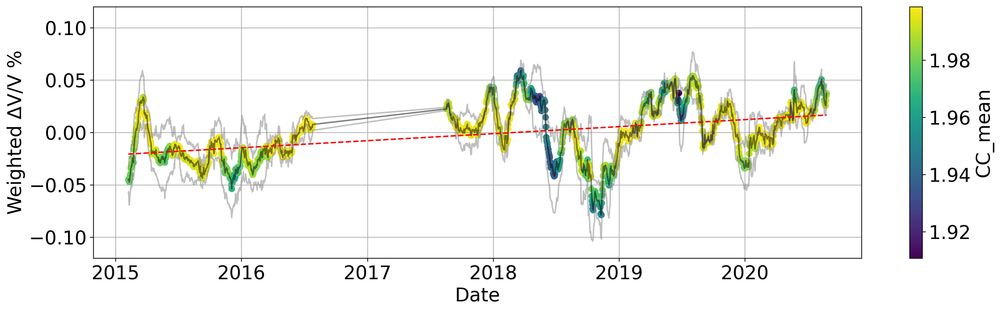

In [12]:
# import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

# Define the paths to your CSV files
file_paths = ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv']

# Predefined array with multipliers (-1 or +1)
multipliers = [-1, 1]

# Read and process dataframes
dataframes = []
for path, multiplier in zip(file_paths, multipliers):
    df = pd.read_csv(path)
    df['DVT'] *= multiplier  # Apply the multiplier to the DVT column
    df['T'] = pd.to_datetime(df['T'])
    df.set_index('T', inplace=True)
    dataframes.append(df)

# Create a unified time index from the union of all timestamps in the dataframes
unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))

# Interpolate data for each dataframe to match the unified index
interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

exclude_ranges = [
    ("2017-02-15", "2017-07-28"),
    ("2016-07-07", "2017-02-17"),
    ("2014-07-07", "2015-01-17"),
    ("2020-08-07", "2021-01-17"),
]

# Exclude the specified date ranges
for start_date, end_date in exclude_ranges:
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    for i in range(len(interpolated_dfs)):
        interpolated_dfs[i] = interpolated_dfs[i].drop(interpolated_dfs[i].loc[start_date:end_date].index)

# Shift the grey individual timeseries by 20 days and plot them
plt.figure(figsize=(16, 5), dpi=300)
for df in interpolated_dfs:
    shifted_df = df.copy()
    shifted_df.index = shifted_df.index + pd.DateOffset(days=20)
    plt.plot(shifted_df.index, shifted_df['DVT'], color='grey', alpha=0.5)

# Calculate CC_mean using squared correlation coefficients for each time point
CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)

# Calculate weighted Δu/u using squared CCT and DVT
weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

# Normalize CC_mean for coloring
norm = mcolors.Normalize(vmin=CC_mean.min(), vmax=CC_mean.max())
cmap = cm.viridis  # Can choose any available colormap

# Create a DataFrame for the weighted Δv/v time series
weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=20)

# Plotting the weighted Δv/v time series with color-coded CC_mean
# Scatter plot for individual markers with color coding
sc = plt.scatter(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], c=CC_mean, cmap=cmap, norm=norm, label='Weighted Δv/v')
# Line plot to connect markers
plt.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], 'k-', alpha=0.5)  # Adjust alpha for line transparency
plt.colorbar(sc, label='CC_mean')

# Adding a trend line
cleaned_df = weighted_dvv_df.dropna(subset=['Weighted Δv/v'])
index_as_int = cleaned_df.index.astype(np.int64)
z = np.polyfit(index_as_int, cleaned_df['Weighted Δv/v'], 1)
p = np.poly1d(z)
plt.plot(weighted_dvv_df.index, p(weighted_dvv_df.index.astype(np.int64)), "r--", label='Trend Line')

# Add labels and legend
plt.xlabel('Date')
plt.ylim([-0.12, 0.12])
plt.ylabel('Weighted Δv/v %')
plt.grid(True)
plt.rcParams.update({'font.size': 20})
plt.xlabel('Date', fontsize=20)
plt.ylabel('Weighted ΔV/V %', fontsize=20)
plt.grid(True)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.show()


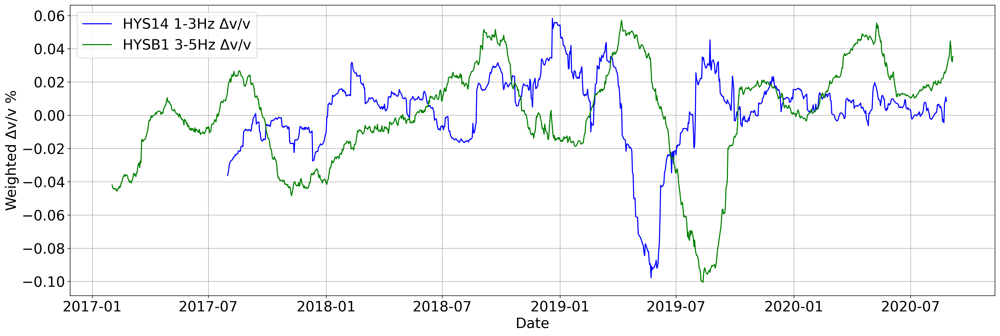

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the paths to your CSV files for all datasets
file_paths = {
    'HYS14 1-3Hz Δv/v': ['HYS14_13ZEp.csv', 'HYS14_13ZEn.csv'],
    'HYSB1 3-5Hz Δv/v': ['HYSB1_2019ZEp.csv', 'HYSB1_2019ZEn.csv'],
    #'HYS14 3-5Hz Δv/v': ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv',],
    #'HYS12 1-3Hz Δv/v': ['HYS12_13ZEp1.csv','HYS12_13ZEn1.csv',],
    #'Interstation Δv/v': ['HYS14B1_052ZZn.csv', 'HYS14B1_052ZZp.csv'],
    #'HYS14 0.1-0.3Hz Δv/v':['HYS14_0103ZEp.csv', 'HYS14_0103ZEn.csv',]
}

# Define the multipliers for each dataset
multipliers = {
    'HYS14 1-3Hz Δv/v': [1, 1],
    'HYSB1 3-5Hz Δv/v': [-1, 1],
    #'HYS14 3-5Hz Δv/v': [-1,1],
    #'HYS12 1-3Hz Δv/v': [1,1],
    #'Interstation Δv/v': [1, -1],
    #'HYS14 0.1-0.3Hz Δv/v':[-1,1]
}

# Define offsets for each dataset
offsets = {
    'HYS14 1-3Hz Δv/v': 20,        # days
    'HYSB1 3-5Hz Δv/v': 30,        # days
    #'HYS14 3-5Hz Δv/v': 20,
    #'HYS12 1-3Hz Δv/v':30,
    #'Interstation Δv/v': 30,
    #'HYS14 0.1-0.3Hz Δv/v':20
}

# Define exclusion ranges for each dataset
exclude_ranges = {
    'HYS14 1-3Hz Δv/v': [("2017-02-15", "2017-07-10"), ("2016-07-07", "2017-03-16"),("2020-08-07", "2021-03-16"),("2000-07-07", "2017-03-01")],
    'HYSB1 3-5Hz Δv/v': [("2020-08-07", "2021-03-16"),("2000-07-07", "2017-01-01")],  # No exclusion ranges for this example
    #'HYS14 3-5Hz Δv/v': [("2017-03-01", "2017-07-30"),("2016-08-01", "2017-03-16"),("2020-08-07", "2021-03-16")],
    #'HYS12 1-3Hz Δv/v':[("2020-08-07", "2021-03-16")],
    #'Interstation Δv/v': [("2023-10-01", "2024-01-30"), ("2010-01-10", "2011-08-05"),("2000-07-07", "2017-03-16")],
    #'HYS14 0.1-0.3Hz Δv/v':[("2017-03-01", "2017-07-30"),("2016-08-01", "2017-03-16")]
}

plt.rcParams.update({'font.size': 20})
# Setup the figure
plt.figure(figsize=(20, 7), dpi=300)
colors = ['blue','green','grey' , 'maroon','black','grey']  # Colors for each dataset

# Loop through each dataset
for i, (label, paths) in enumerate(file_paths.items()):
    dataframes = []
    for path, multiplier in zip(paths, multipliers[label]):
        # Load and process data
        df = pd.read_csv(path)
        df['DVT'] *= multiplier  # Apply multiplier
        df['T'] = pd.to_datetime(df['T'])
        df.set_index('T', inplace=True)
        dataframes.append(df)

    # Create a unified time index
    unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))
    interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

    # Exclude specified date ranges
    for start, end in exclude_ranges[label]:
        start_date = pd.to_datetime(start)
        end_date = pd.to_datetime(end)
        for j in range(len(interpolated_dfs)):
            interpolated_dfs[j] = interpolated_dfs[j].drop(interpolated_dfs[j].loc[start_date:end_date].index)

    # Calculate weighted Δv/v for the current dataset
    CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)
    weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

    # Create a DataFrame for weighted Δv/v
    weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
    weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=offsets[label])

    # Plot the weighted Δv/v
    plt.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], color=colors[i], label=label)

# Finalize plot
plt.xlabel('Date')
plt.ylabel('Weighted Δv/v %')
#plt.ylim([-0.1, 0.1])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


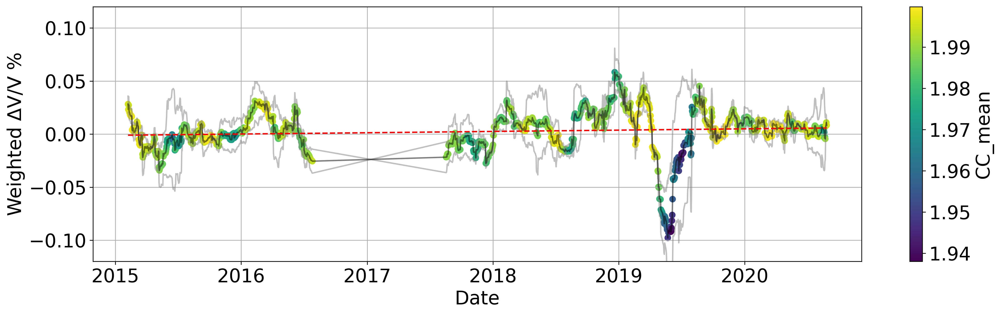

In [30]:
# import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

# Define the paths to your CSV files
file_paths = ['HYS14_13ZEp.csv', 'HYS14_13ZEn.csv']

# Predefined array with multipliers (-1 or +1)
multipliers = [1, 1]

# Read and process dataframes
dataframes = []
for path, multiplier in zip(file_paths, multipliers):
    df = pd.read_csv(path)
    df['DVT'] *= multiplier  # Apply the multiplier to the DVT column
    df['T'] = pd.to_datetime(df['T'])
    df.set_index('T', inplace=True)
    dataframes.append(df)

# Create a unified time index from the union of all timestamps in the dataframes
unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))

# Interpolate data for each dataframe to match the unified index
interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

exclude_ranges = [
    ("2017-02-15", "2017-07-28"),
    ("2016-07-07", "2017-02-17"),
    ("2014-07-07", "2015-01-17"),
    ("2020-08-07", "2021-01-17"),
]

# Exclude the specified date ranges
for start_date, end_date in exclude_ranges:
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    for i in range(len(interpolated_dfs)):
        interpolated_dfs[i] = interpolated_dfs[i].drop(interpolated_dfs[i].loc[start_date:end_date].index)

# Shift the grey individual timeseries by 20 days and plot them
plt.figure(figsize=(16, 5), dpi=300)
for df in interpolated_dfs:
    shifted_df = df.copy()
    shifted_df.index = shifted_df.index + pd.DateOffset(days=20)
    plt.plot(shifted_df.index, shifted_df['DVT'], color='grey', alpha=0.5)

# Calculate CC_mean using squared correlation coefficients for each time point
CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)

# Calculate weighted Δu/u using squared CCT and DVT
weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

# Normalize CC_mean for coloring
norm = mcolors.Normalize(vmin=CC_mean.min(), vmax=CC_mean.max())
cmap = cm.viridis  # Can choose any available colormap

# Create a DataFrame for the weighted Δv/v time series
weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=20)

# Plotting the weighted Δv/v time series with color-coded CC_mean
# Scatter plot for individual markers with color coding
sc = plt.scatter(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], c=CC_mean, cmap=cmap, norm=norm, label='Weighted Δv/v')
# Line plot to connect markers
plt.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], 'k-', alpha=0.5)  # Adjust alpha for line transparency
plt.colorbar(sc, label='CC_mean')

# Adding a trend line
cleaned_df = weighted_dvv_df.dropna(subset=['Weighted Δv/v'])
index_as_int = cleaned_df.index.astype(np.int64)
z = np.polyfit(index_as_int, cleaned_df['Weighted Δv/v'], 1)
p = np.poly1d(z)
plt.plot(weighted_dvv_df.index, p(weighted_dvv_df.index.astype(np.int64)), "r--", label='Trend Line')

# Add labels and legend
plt.xlabel('Date')
plt.ylim([-0.12, 0.12])
plt.ylabel('Weighted Δv/v %')
plt.grid(True)
plt.rcParams.update({'font.size': 18})
plt.xlabel('Date', fontsize=20)
plt.ylabel('Weighted ΔV/V %', fontsize=20)
plt.grid(True)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tight_layout()
plt.show()


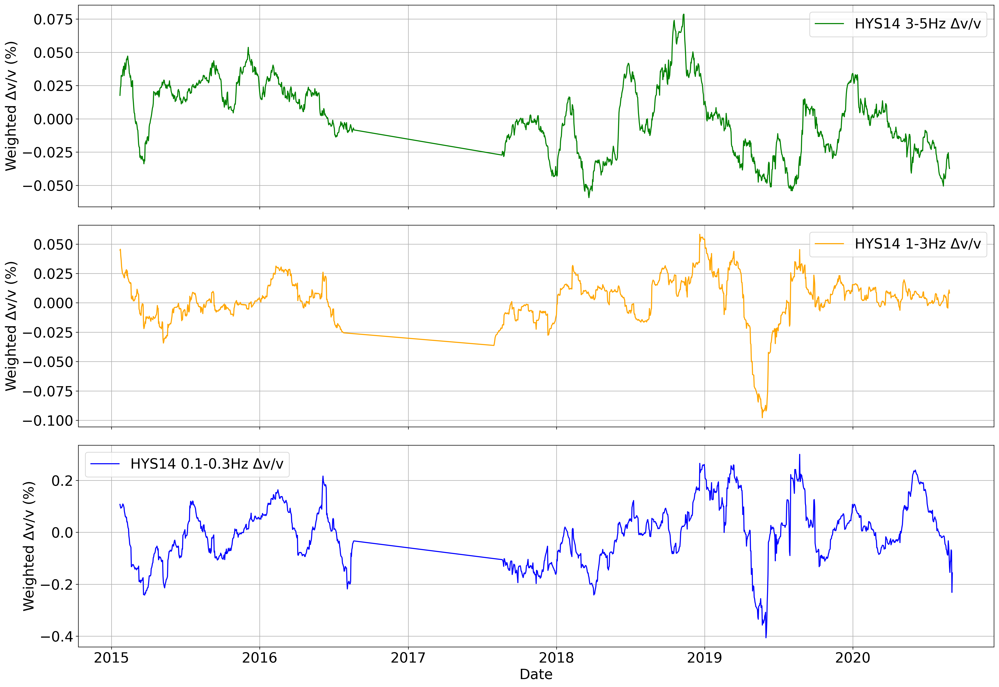

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the paths to your CSV files for all datasets
file_paths = {
    'HYS14 3-5Hz Δv/v': ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv'],
    'HYS14 1-3Hz Δv/v': ['HYS14_13ZEp.csv', 'HYS14_13ZEn.csv'],
    'HYS14 0.1-0.3Hz Δv/v': ['HYS14_0103ZEp.csv', 'HYS14_0103ZEn.csv']
}

# Define the multipliers for each dataset
multipliers = {
    'HYS14 3-5Hz Δv/v': [1, -1],
    'HYS14 1-3Hz Δv/v': [1, 1],
    'HYS14 0.1-0.3Hz Δv/v': [-1, 1]
}

# Define offsets for each dataset
offsets = {
    'HYS14 3-5Hz Δv/v': 20,
    'HYS14 1-3Hz Δv/v': 20,        # days
    'HYS14 0.1-0.3Hz Δv/v': 20
}

# Define exclusion ranges for each dataset
exclude_ranges = {
    'HYS14 3-5Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 1-3Hz Δv/v': [("2017-02-15", "2017-07-10"), ("2016-07-07", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.1-0.3Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16")]
}

plt.rcParams.update({'font.size': 20})
# Setup the subplots
fig, axes = plt.subplots(nrows=3, figsize=(20, 14), dpi=300, sharex=True)
colors = ['green', 'orange', 'blue']  # Colors for each dataset

# Loop through each dataset
for i, (label, paths) in enumerate(file_paths.items()):
    dataframes = []
    for path, multiplier in zip(paths, multipliers[label]):
        # Load and process data
        df = pd.read_csv(path)
        df['DVT'] *= multiplier  # Apply multiplier
        df['T'] = pd.to_datetime(df['T'])
        df.set_index('T', inplace=True)
        dataframes.append(df)

    # Create a unified time index
    unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))
    interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

    # Exclude specified date ranges
    for start, end in exclude_ranges[label]:
        start_date = pd.to_datetime(start)
        end_date = pd.to_datetime(end)
        for j in range(len(interpolated_dfs)):
            interpolated_dfs[j] = interpolated_dfs[j].drop(interpolated_dfs[j].loc[start_date:end_date].index)

    # Calculate weighted Δv/v for the current dataset
    CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)
    weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

    # Create a DataFrame for weighted Δv/v
    weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
    weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=offsets[label])

    # Plot the weighted Δv/v in the corresponding subplot
    ax = axes[i]
    ax.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], color=colors[i], label=label)
    ax.set_ylabel('Weighted Δv/v (%)')
    ax.legend()
    ax.grid(True)

# Finalize plot
axes[-1].set_xlabel('Date')  # Set x-label on the last subplot
plt.tight_layout()
plt.show()


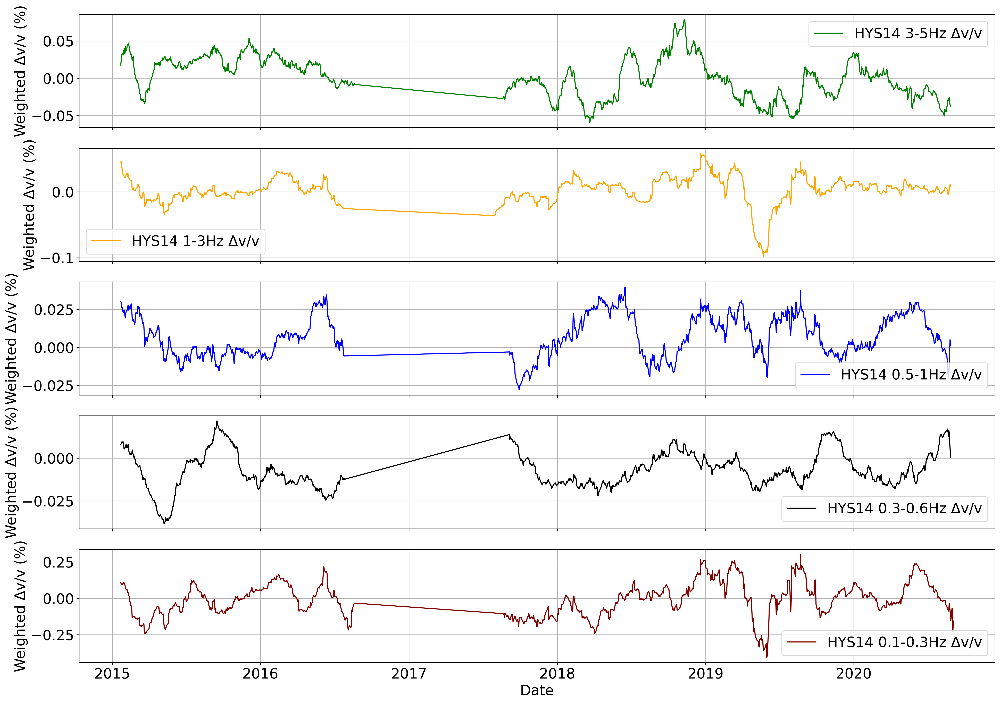

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the paths to your CSV files for all datasets
file_paths = {
    'HYS14 3-5Hz Δv/v': ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv'],
    'HYS14 1-3Hz Δv/v': ['HYS14_13ZEp.csv', 'HYS14_13ZEn.csv'],
    'HYS14 0.5-1Hz Δv/v': ['HYS14_051ZEp.csv', 'HYS14_051ZEn.csv'],
    'HYS14 0.3-0.6Hz Δv/v': ['HYS14_0306ZEp.csv', 'HYS14_0306ZEn.csv'],
    'HYS14 0.1-0.3Hz Δv/v': ['HYS14_0103ZEp.csv', 'HYS14_0103ZEn.csv']
}

# Define the multipliers for each dataset
multipliers = {
    'HYS14 3-5Hz Δv/v': [1, -1],
    'HYS14 1-3Hz Δv/v': [1, 1],
    'HYS14 0.5-1Hz Δv/v': [-1, 1],
    'HYS14 0.3-0.6Hz Δv/v':[1, 1],
    'HYS14 0.1-0.3Hz Δv/v': [-1, 1]
}

# Define offsets for each dataset
offsets = {
    'HYS14 3-5Hz Δv/v': 20,
    'HYS14 1-3Hz Δv/v': 20,        # days
    'HYS14 0.5-1Hz Δv/v': 20,
    'HYS14 0.3-0.6Hz Δv/v':20,
    'HYS14 0.1-0.3Hz Δv/v': 20
}

# Define exclusion ranges for each dataset
exclude_ranges = {
    'HYS14 3-5Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 1-3Hz Δv/v': [("2017-02-15", "2017-07-10"), ("2016-07-07", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.5-1Hz Δv/v':[("2017-02-15", "2017-08-15"), ("2016-07-07", "2017-03-18"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.3-0.6Hz Δv/v': [("2017-02-15", "2017-08-15"), ("2016-07-07", "2017-03-18"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.1-0.3Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16")]
}

plt.rcParams.update({'font.size': 20})
# Setup the subplots
fig, axes = plt.subplots(nrows=5, figsize=(20, 14), dpi=300, sharex=True)
colors = ['green', 'orange', 'blue','black','maroon']  # Colors for each dataset

# Loop through each dataset
for i, (label, paths) in enumerate(file_paths.items()):
    dataframes = []
    for path, multiplier in zip(paths, multipliers[label]):
        # Load and process data
        df = pd.read_csv(path)
        df['DVT'] *= multiplier  # Apply multiplier
        df['T'] = pd.to_datetime(df['T'])
        df.set_index('T', inplace=True)
        dataframes.append(df)

    # Create a unified time index
    unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))
    interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

    # Exclude specified date ranges
    for start, end in exclude_ranges[label]:
        start_date = pd.to_datetime(start)
        end_date = pd.to_datetime(end)
        for j in range(len(interpolated_dfs)):
            interpolated_dfs[j] = interpolated_dfs[j].drop(interpolated_dfs[j].loc[start_date:end_date].index)

    # Calculate weighted Δv/v for the current dataset
    CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)
    weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

    # Create a DataFrame for weighted Δv/v
    weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
    weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=offsets[label])

    # Plot the weighted Δv/v in the corresponding subplot
    ax = axes[i]
    ax.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], color=colors[i], label=label)
    ax.set_ylabel('Weighted Δv/v (%)')
    ax.legend()
    ax.grid(True)

# Finalize plot
axes[-1].set_xlabel('Date')  # Set x-label on the last subplot
plt.tight_layout()
plt.show()


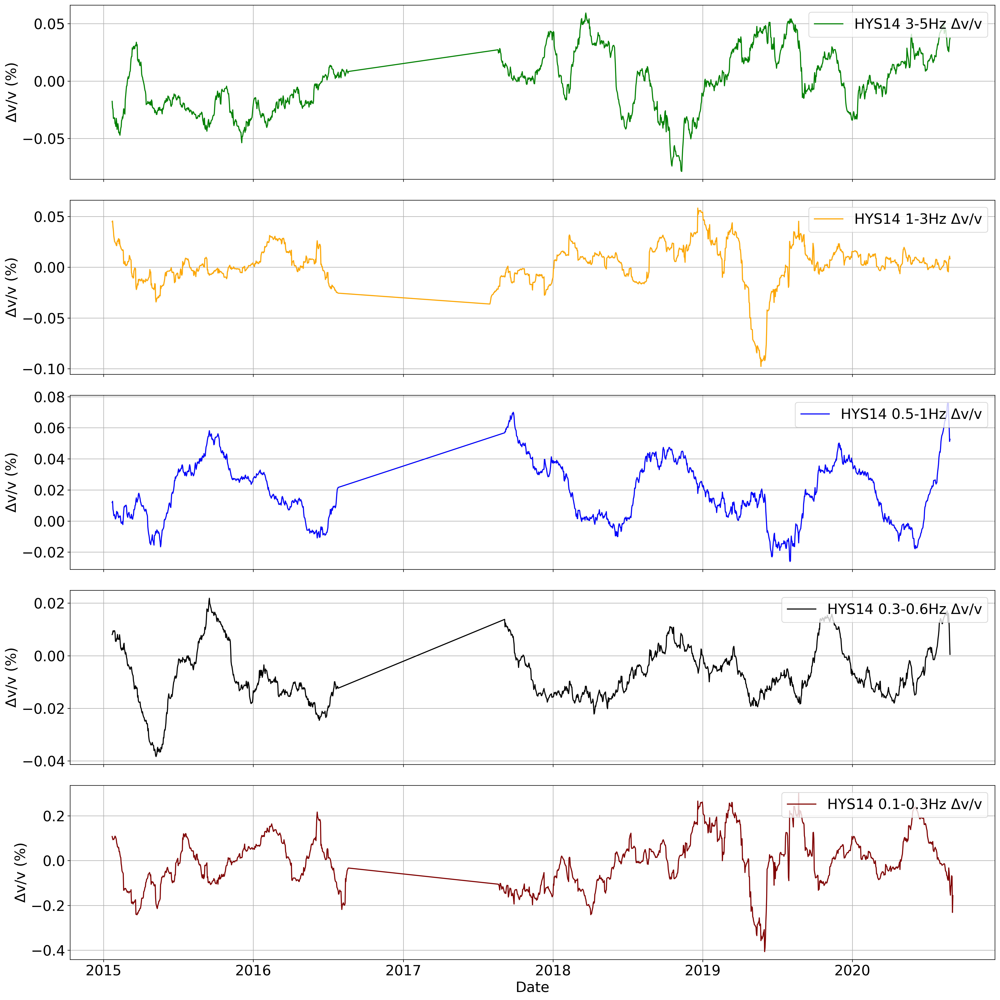

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define the paths to your CSV files for all datasets
file_paths = {
    'HYS14 3-5Hz Δv/v': ['HYS14_35ZEp3.csv', 'HYS14_35ZEn3.csv'],
    'HYS14 1-3Hz Δv/v': ['HYS14_13ZEp.csv', 'HYS14_13ZEn.csv'],
    'HYS14 0.5-1Hz Δv/v': ['HYS14_051ZEp.csv', 'HYS14_051ZEn.csv'],
    'HYS14 0.3-0.6Hz Δv/v': ['HYS14_0306ZEp.csv', 'HYS14_0306ZEn.csv'],
    'HYS14 0.1-0.3Hz Δv/v': ['HYS14_0103ZEp.csv', 'HYS14_0103ZEn.csv']
}

# Define the multipliers for each dataset
multipliers = {
    'HYS14 3-5Hz Δv/v': [-1, 1],
    'HYS14 1-3Hz Δv/v': [1, 1],
    'HYS14 0.5-1Hz Δv/v': [1, 1],
    'HYS14 0.3-0.6Hz Δv/v':[1, 1],
    'HYS14 0.1-0.3Hz Δv/v': [-1, 1]
}

# Define offsets for each dataset
offsets = {
    'HYS14 3-5Hz Δv/v': 20,
    'HYS14 1-3Hz Δv/v': 20,        # days
    'HYS14 0.5-1Hz Δv/v': 20,
    'HYS14 0.3-0.6Hz Δv/v':20,
    'HYS14 0.1-0.3Hz Δv/v': 20
}

# Define exclusion ranges for each dataset
exclude_ranges = {
    'HYS14 3-5Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 1-3Hz Δv/v': [("2017-02-15", "2017-07-10"), ("2016-07-07", "2017-03-16"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.5-1Hz Δv/v':[("2017-02-15", "2017-08-15"), ("2016-07-07", "2017-03-18"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.3-0.6Hz Δv/v': [("2017-02-15", "2017-08-15"), ("2016-07-07", "2017-03-18"), ("2020-08-07", "2021-03-16")],
    'HYS14 0.1-0.3Hz Δv/v': [("2017-03-01", "2017-07-30"), ("2016-08-01", "2017-03-16")]
}

plt.rcParams.update({'font.size': 20})
# Setup the subplots
fig, axes = plt.subplots(nrows=5, figsize=(20, 20), dpi=300, sharex=True)
colors = ['green', 'orange', 'blue','black','maroon']  # Colors for each dataset

# Loop through each dataset
for i, (label, paths) in enumerate(file_paths.items()):
    dataframes = []
    for path, multiplier in zip(paths, multipliers[label]):
        # Load and process data
        df = pd.read_csv(path)
        df['DVT'] *= multiplier  # Apply multiplier
        df['T'] = pd.to_datetime(df['T'])
        df.set_index('T', inplace=True)
        dataframes.append(df)

    # Create a unified time index
    unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))
    interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

    # Exclude specified date ranges
    for start, end in exclude_ranges[label]:
        start_date = pd.to_datetime(start)
        end_date = pd.to_datetime(end)
        for j in range(len(interpolated_dfs)):
            interpolated_dfs[j] = interpolated_dfs[j].drop(interpolated_dfs[j].loc[start_date:end_date].index)

    # Calculate weighted Δv/v for the current dataset
    CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)
    weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

    # Create a DataFrame for weighted Δv/v
    weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
    weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=offsets[label])

    # Plot the weighted Δv/v in the corresponding subplot
    ax = axes[i]
    ax.plot(weighted_dvv_df.index, weighted_dvv_df['Weighted Δv/v'], color=colors[i], label=label)
    ax.set_ylabel('Δv/v (%)')
    #ax.legend()
    ax.grid(True)
    
    ax.legend(loc='upper right')

# Finalize plot
axes[-1].set_xlabel('Date')  # Set x-label on the last subplot
plt.tight_layout()
plt.show()


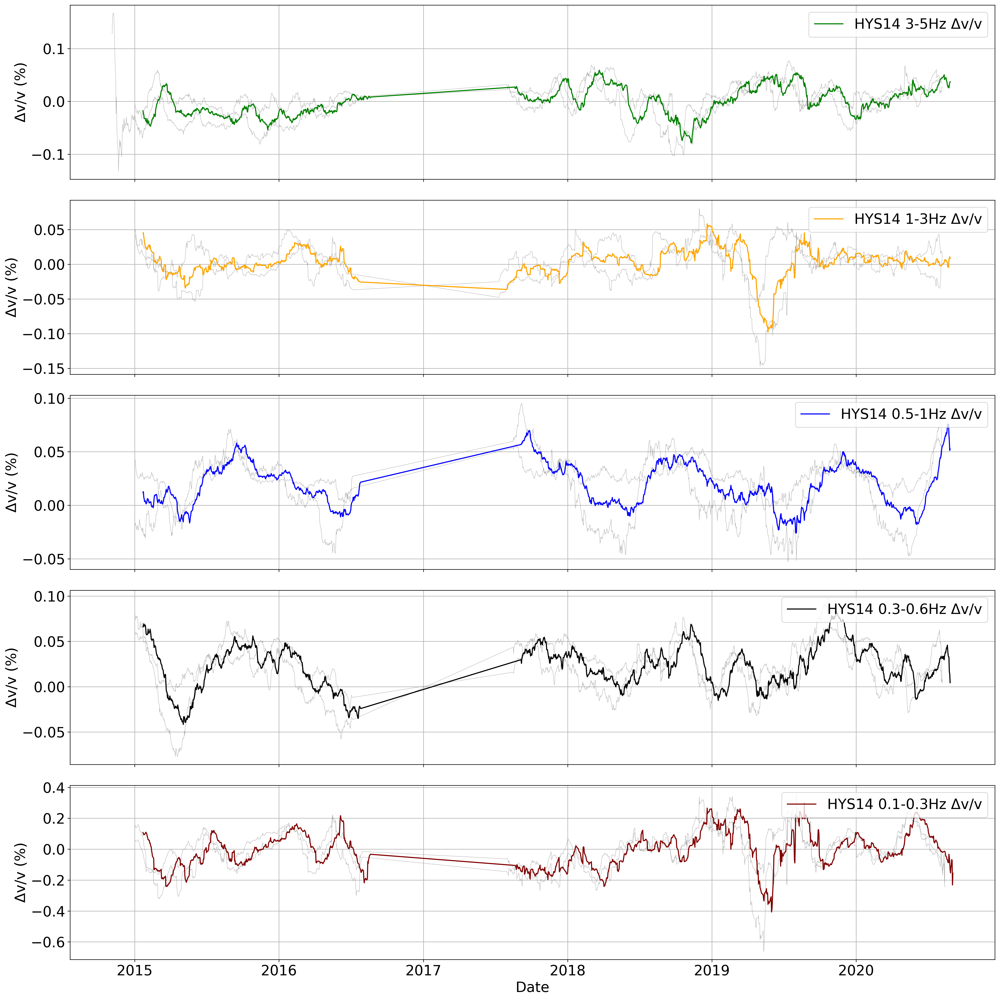

In [94]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

# Define the paths to your CSV files
file_paths_1 = [
    'B1_60daystack_3p0to5p0 negativeZE 102svd7x.csv',
    'B1_60daystack_3p0to5p0 positiveZE 210svd7x.csv',
    'B1_60daystack_3p0to5p0 negativeZN 102svd7x.csv',
    'B1_60daystack_3p0to5p0 positiveZN 210svd7x.csv',
    'B1_60daystack_3p0to5p0 positiveNE 210svd7x.csv',
]

file_paths_2 = [
    'HYSB1_addonNE_negative.csv',
    'HYSB1_addonZE_positive.csv',
    'HYSB1_addonZN_negative.csv',
    'HYSB1_addonZN_positive.csv',
    'HYSB1_addonNE_positive.csv',
]

file_paths_3 = [
    'HYSB1_NE35n1_10.csv',
    'HYSB1_ZE35p1_10.csv'
]

file_paths_4 = [
    'B1_60daystack_3p0to5p0 negativeNE 102svd7x.csv',
]

# Predefined arrays with multipliers (-1 or +1)
multipliers_1 = [1, 1, 1, 1, 1,-1]
multipliers_2 = [1, 1, -1, 1, 1]
multipliers_3 = [1, 1]
multipliers_4 = [-1]

def process_files(file_paths, multipliers):
    dataframes = []
    for path, multiplier in zip(file_paths, multipliers):
        df = pd.read_csv(path)
        df['DVT'] *= multiplier  # Apply the multiplier to the DVT column
        dataframes.append(df)

    # Parse timestamps and set them as the index
    for df in dataframes:
        df['T'] = pd.to_datetime(df['T'])
        df.set_index('T', inplace=True)

    # Create a unified time index from the union of all timestamps in the dataframes
    unified_index = pd.to_datetime(sorted(set.union(*(set(df.index) for df in dataframes))))

    # Interpolate data for each dataframe to match the unified index
    interpolated_dfs = [df.reindex(unified_index).interpolate() for df in dataframes]

    # Calculate CC_mean using squared correlation coefficients for each time point
    CC_mean = sum(df['CCT']**2 for df in interpolated_dfs)

    # Calculate weighted Δu/u using squared CCT and DVT
    weighted_dvv = sum(df['CCT']**2 * df['DVT'] for df in interpolated_dfs) / CC_mean

    # Create a DataFrame for the weighted Δv/v time series
    weighted_dvv_df = pd.DataFrame(weighted_dvv, columns=['Weighted Δv/v'])
    weighted_dvv_df.index = weighted_dvv_df.index + pd.DateOffset(days=30)

    return interpolated_dfs, weighted_dvv_df, CC_mean

# Process all sets of files
interpolated_dfs_1, weighted_dvv_df_1, CC_mean_1 = process_files(file_paths_1, multipliers_1)
interpolated_dfs_2, weighted_dvv_df_2, CC_mean_2 = process_files(file_paths_2, multipliers_2)
interpolated_dfs_3, _, _ = process_files(file_paths_3, multipliers_3)

# Combine CC_mean for a common colorbar scale
combined_CC_mean = pd.concat([CC_mean_1, CC_mean_2])
norm = mcolors.Normalize(vmin=combined_CC_mean.min(), vmax=combined_CC_mean.max())
cmap = cm.viridis  # Can choose any available colormap

# Plotting section
plt.figure(figsize=(20, 5), dpi=300)

# Step 1: Plot each individual DVT time series in black without applying CC
for df in interpolated_dfs_1:
    df.index = df.index + pd.DateOffset(days=30)
    plt.plot(df.index, df['DVT'], color='black', alpha=0.35, linestyle='--', label='Individual Time Series (Set 1)')
for df in interpolated_dfs_2:
    df.index = df.index + pd.DateOffset(days=30)
    plt.plot(df.index, df['DVT'], color='black', alpha=0.35, linestyle='--', label='Individual Time Series (Set 2)')

# Step 2: Plot the weighted Δv/v time series from the first set of files with color-coded CC_mean
sc1 = plt.scatter(weighted_dvv_df_1.index, weighted_dvv_df_1['Weighted Δv/v'], c=CC_mean_1, cmap=cmap, norm=norm, label='Weighted Δv/v (Set 1)')
plt.plot(weighted_dvv_df_1.index, weighted_dvv_df_1['Weighted Δv/v'], 'k-', alpha=0.5)  # Line plot to connect markers

# Step 3: Plot the weighted Δv/v time series from the second set of files with color-coded CC_mean
sc2 = plt.scatter(weighted_dvv_df_2.index, weighted_dvv_df_2['Weighted Δv/v'], c=CC_mean_2, cmap=cmap, norm=norm, label='Weighted Δv/v (Set 2)', marker='x')
plt.plot(weighted_dvv_df_2.index, weighted_dvv_df_2['Weighted Δv/v'], 'b-', alpha=0.5)  # Line plot to connect markers

# Step 4: Plot each individual Δv/v time series from the third set of files in red without color-coding
for i, df in enumerate(interpolated_dfs_3):
    df.index = df.index + pd.DateOffset(days=30)
    if i == 0:
        df['DVT'] = df['DVT'] / 5  # Adjust the first file of the third set
    plt.plot(df.index, df['DVT'], color='blue', alpha=0.35, linestyle='--', label='Individual Time Series (Set 3)')

# Add a single colorbar for both sets
plt.colorbar(sc2, label='CC_mean')

# Plot labels and customization
plt.xlabel('Date', fontsize=20)
plt.ylabel('Weighted ΔV/V %', fontsize=20)
plt.grid(True)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([-0.105,0.085])

# Show the plot
plt.tight_layout()
plt.show()
